## Trace Analysis of SAT data

In [38]:
import warnings
#to suppress seaborn palette warnings
warnings.filterwarnings("ignore", category=UserWarning)
#to suppress seaborn error estimation NaN warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

import os

import pandas as pd
import seaborn as sns

#to suppress pandas reassignment false positive warnings
pd.options.mode.chained_assignment = None  # default='warn'


#### Load Data

In [39]:
path1h = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\Eunsol_data\\all_animals\\analysis_1h'
path2h = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\Eunsol_data\\all_animals\\analysis_2h'
path4h = 'C:\\Users\\swind\\Documents\\lab_work\\Barth\\behavior_analysis\\Eunsol_data\\all_animals\\analysis_4h'

In [40]:
def load_from_analysis(path):
    counts, perf, data = pd.DataFrame(),pd.DataFrame(), pd.DataFrame()
    for condition_dir in os.listdir(path):
        newpath = path + "\\"  + condition_dir
        for f in os.listdir(newpath):
            filepath = newpath + "\\" + f
            if os.path.isfile(filepath):
                if ".csv" in f:
                    if "performance" in f:
                        df = pd.read_csv(filepath)
                        perf = pd.concat([perf, df])
                    elif "counts" in f:
                        df = pd.read_csv(filepath)
                        counts = pd.concat([counts, df])
                    elif "lick_frequency" in f:
                        df = pd.read_csv(filepath)
                        data = pd.concat([data, df])
    return (data, perf, counts)

data4h, perf4h, counts4h = load_from_analysis(path4h)
data2h, perf2h, counts2h = load_from_analysis(path2h)
data1h, perf1h, counts1h = load_from_analysis(path1h)

### Anticipatory Licking Curves

#### 1 hour

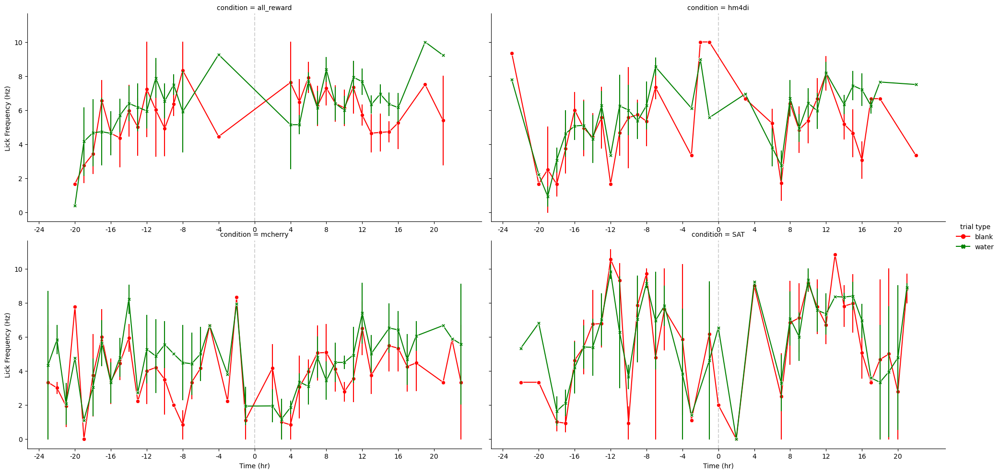

In [41]:
antlick1h = data1h[data1h["Time (ms)"] == 1000]
cond = (antlick1h["Time (hr)"] < 24) & (antlick1h["Time (hr)"] > -24) 

g = sns.relplot(antlick1h[cond], x="Time (hr)", y="lick", hue="trial type", col="condition", palette=["red", "green"], hue_order=["blank", "water"], 
            kind="line", errorbar="se", err_style="bars", style="trial type", dashes=False, markers=True, aspect=2, col_wrap=2)
ticks = [i for i in range(-24, 24, 4)]
for ax in g.axes.flat:
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticks, ha='center')
    ax.tick_params(labelbottom=True)
    ax.set_ylabel("Lick Frequency (Hz)")

#### 1 hour timebin, hours 4-16

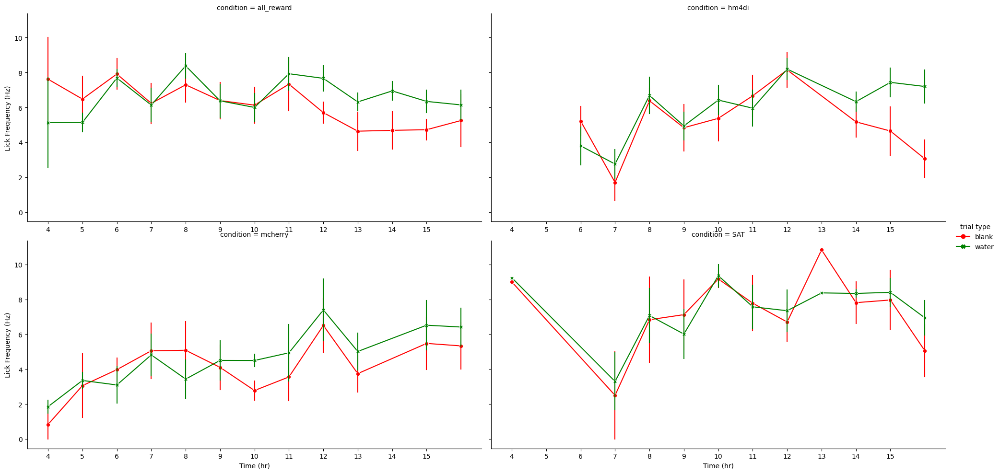

In [42]:
antlick1h = data1h[data1h["Time (ms)"] == 1000]
cond = (antlick1h["Time (hr)"] <=16) & (antlick1h["Time (hr)"] >= 4) 

g = sns.relplot(antlick1h[cond], x="Time (hr)", y="lick", hue="trial type", col="condition", palette=["red", "green"], hue_order=["blank", "water"], 
            kind="line", errorbar="se", err_style="bars", style="trial type", dashes=False, markers=True, aspect=2, col_wrap=2)
ticks = [i for i in range(4, 16, 1)]
for ax in g.axes.flat:
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticks, ha='center')
    ax.tick_params(labelbottom=True)
    ax.set_ylabel("Lick Frequency (Hz)")

#### 2 hours

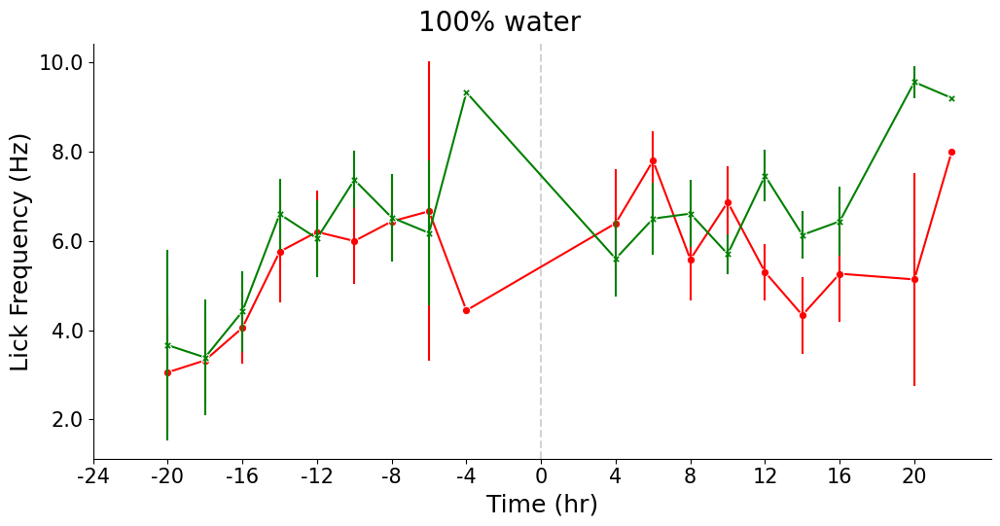

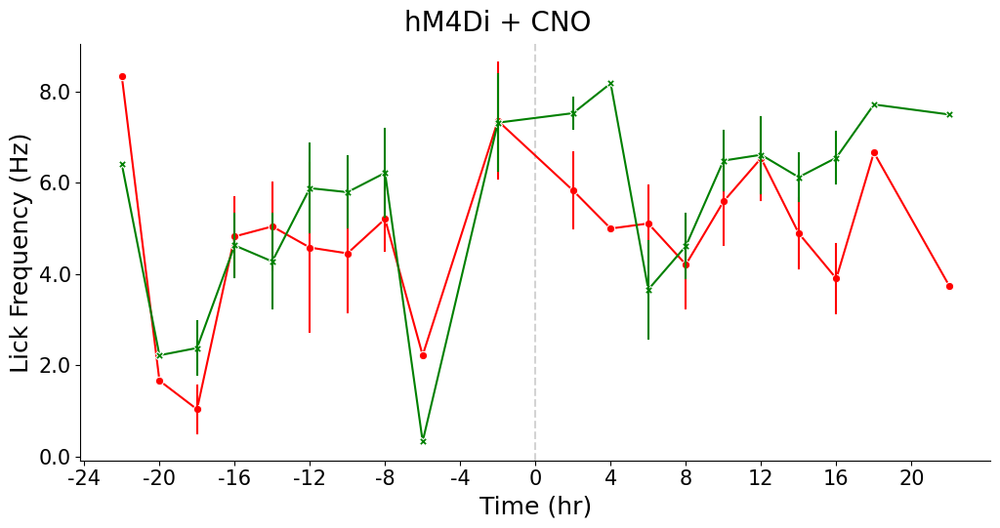

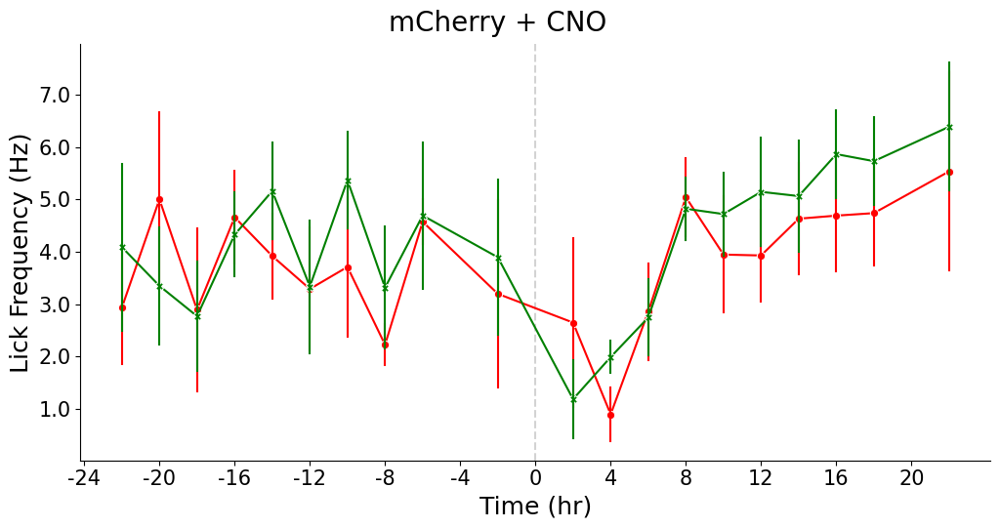

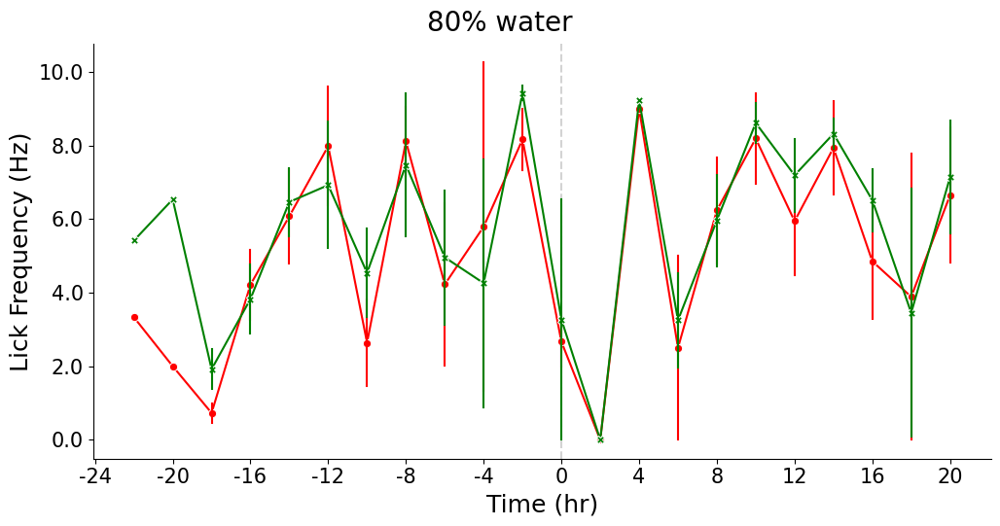

In [43]:
titles = {"all_reward":"100% water", "SAT": "80% water", "hm4di":"hM4Di + CNO", "mcherry":"mCherry + CNO"}
antlick2h = data2h[data2h["Time (ms)"] == 1000]
cond = (antlick2h["Time (hr)"] < 24) & (antlick2h["Time (hr)"] > -24) 
for condition in antlick2h["condition"].unique():
    g = sns.relplot(antlick2h[cond & (antlick2h["condition"] == condition)], x="Time (hr)", y="lick", hue="trial type", palette=["red", "green"], hue_order=["blank", "water"], 
                kind="line", errorbar="se", err_style="bars", style="trial type", dashes=False, markers=True, aspect=2, legend=False)
    ticks = [i for i in range(-24, 24, 4)]
    g.fig.suptitle(f"{titles[condition]}", x=.48, y=1.04,size=20)
    for ax in g.axes.flat:
        ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
        ax.set_xticks(ticks)
        ax.set_xticklabels(ticks, ha='center', fontdict={"fontsize":15})
        ax.set_yticklabels(ax.get_yticks(), fontdict={"fontsize":15})
        ax.tick_params(labelbottom=True)
        ax.set_ylabel("Lick Frequency (Hz)", size=18)
        ax.set_xlabel("Time (hr)", size=18)


#### 4 hours

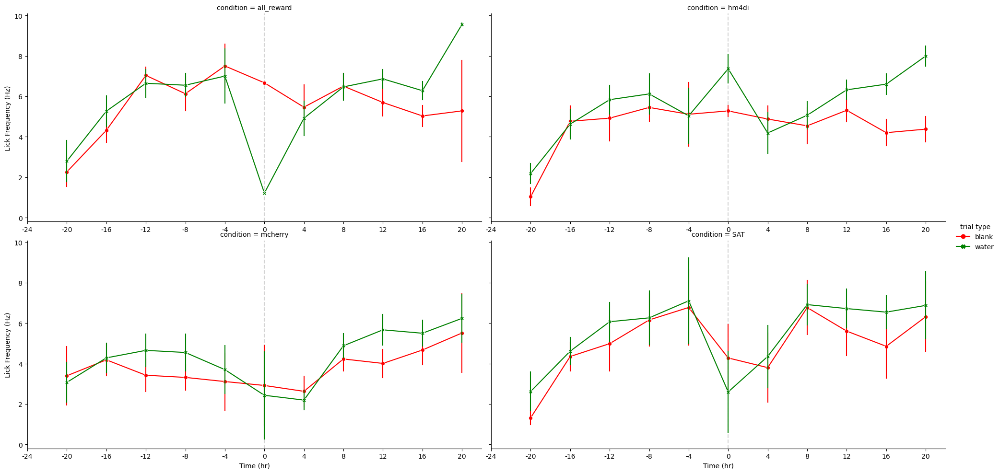

In [44]:
antlick4h = data4h[data4h["Time (ms)"] == 1000]
cond = (antlick4h["Time (hr)"] < 24) & (antlick4h["Time (hr)"] > -24) 

g = sns.relplot(antlick4h[cond], x="Time (hr)", y="lick", hue="trial type", col="condition", palette=["red", "green"], hue_order=["blank", "water"], 
            kind="line", errorbar="se", err_style="bars", style="trial type", dashes=False, markers=True, aspect=2, col_wrap=2)
ticks = [i for i in range(-24, 24, 4)]
for ax in g.axes.flat:
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticks, ha='center')
    ax.tick_params(labelbottom=True)
    ax.set_ylabel("Lick Frequency (Hz)")

### Number of trials

#### 1 hour

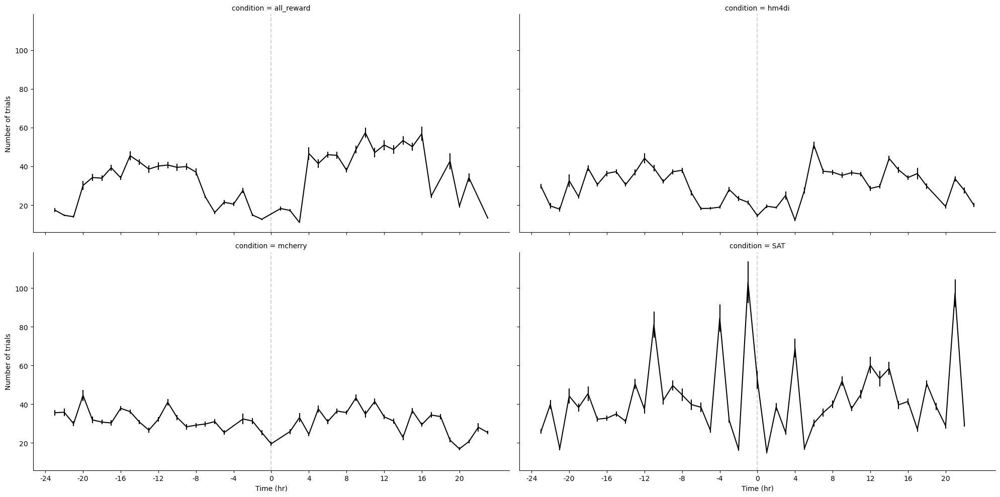

In [45]:
cond = (counts1h["Time (hr)"] < 24) & (counts1h["Time (hr)"] > -24) 
g = sns.relplot(counts1h[cond], x="Time (hr)", y="trial no", color="k", kind="line", col="condition",errorbar="se", err_style="bars", aspect=2, col_wrap=2)

ticks = [i for i in range(-24, 24, 4)]
for ax in g.axes.flat:
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticks, ha='center')
    ax.set_ylabel("Number of trials")

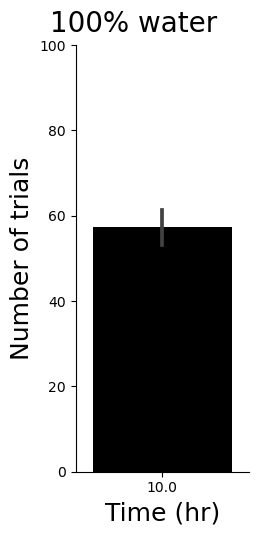

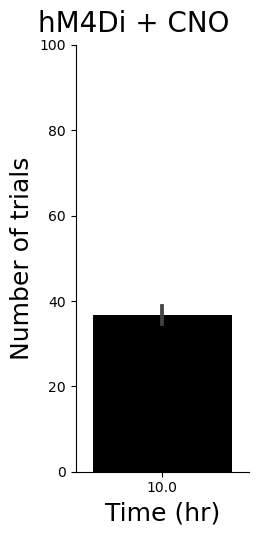

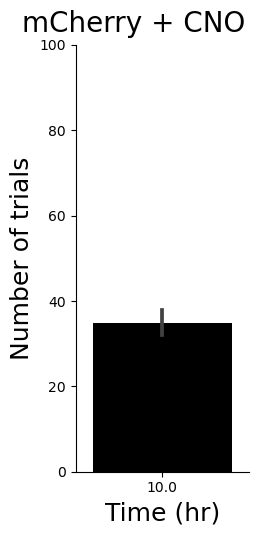

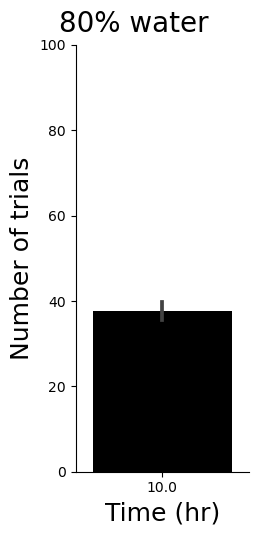

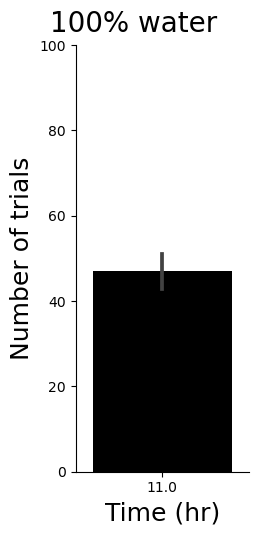

...

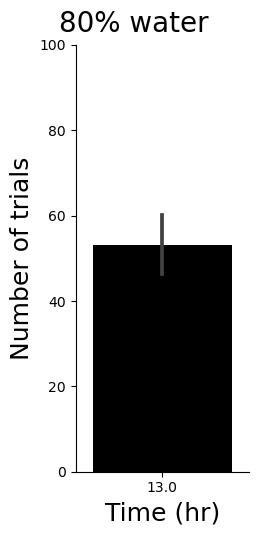

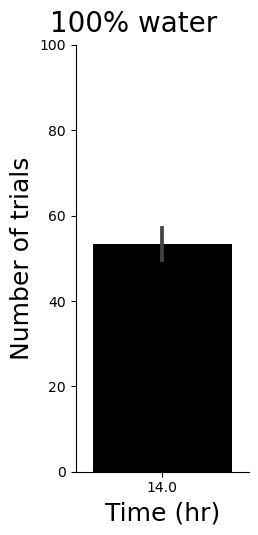

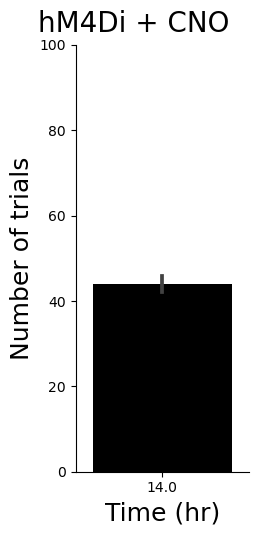

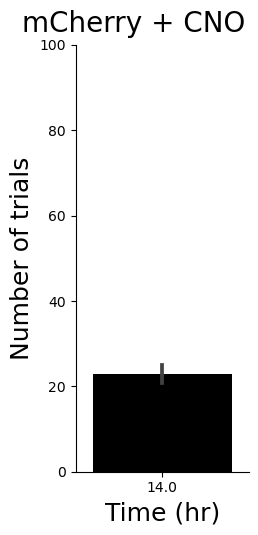

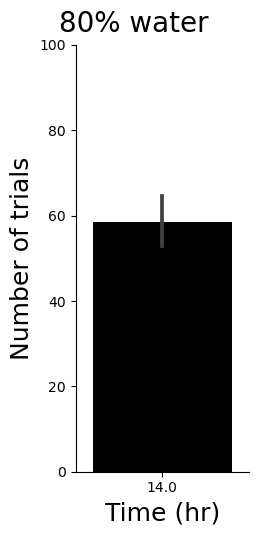

In [93]:
cond = (counts1h["Time (hr)"] < 24) & (counts1h["Time (hr)"] > -24) 
for h in range(10, 15, 1):
    for condition in counts1h["condition"].unique():
        g = sns.catplot(counts1h[(counts1h["Time (hr)"] == h) & (counts1h["condition"] == condition)], x="Time (hr)", y="trial no", color="k", kind="bar", 
         aspect=0.5, legend=False)
        g.fig.suptitle(f"{titles[condition]}", x=.48, y=1.04,size=20)
        for ax in g.axes.flat:
            ax.tick_params(labelbottom=True)
            ax.set_ylabel("Number of trials", size=18)
            ax.set_ylim([0, 100])
            ax.set_xlabel("Time (hr)", size=18)


#### 2 hours

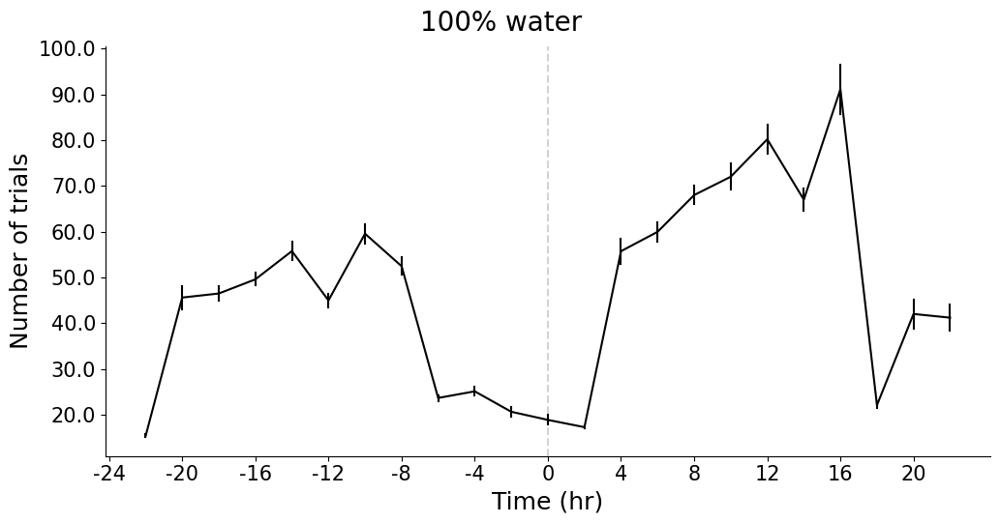

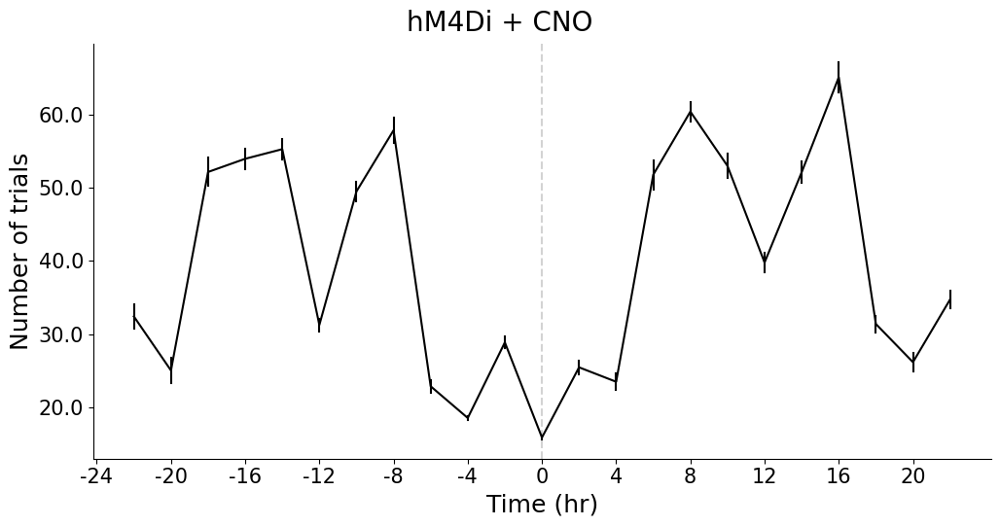

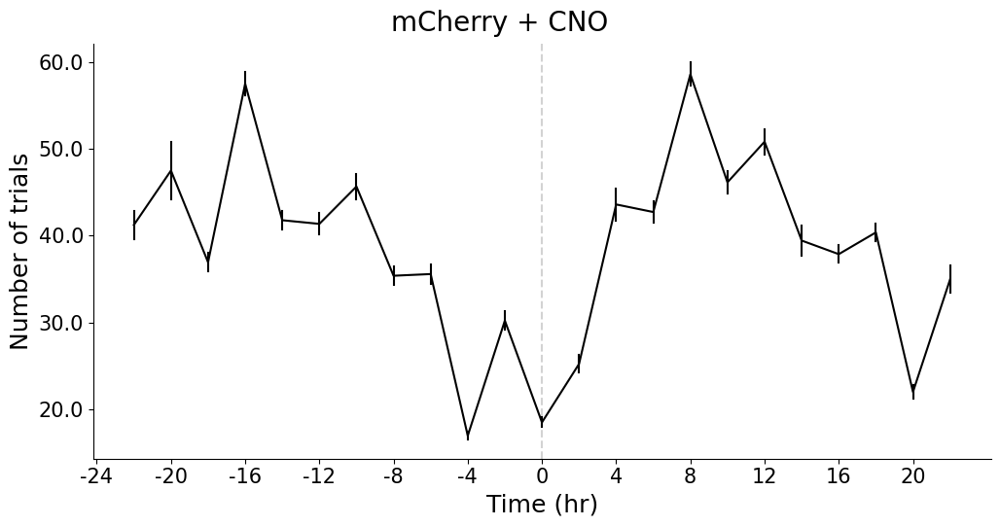

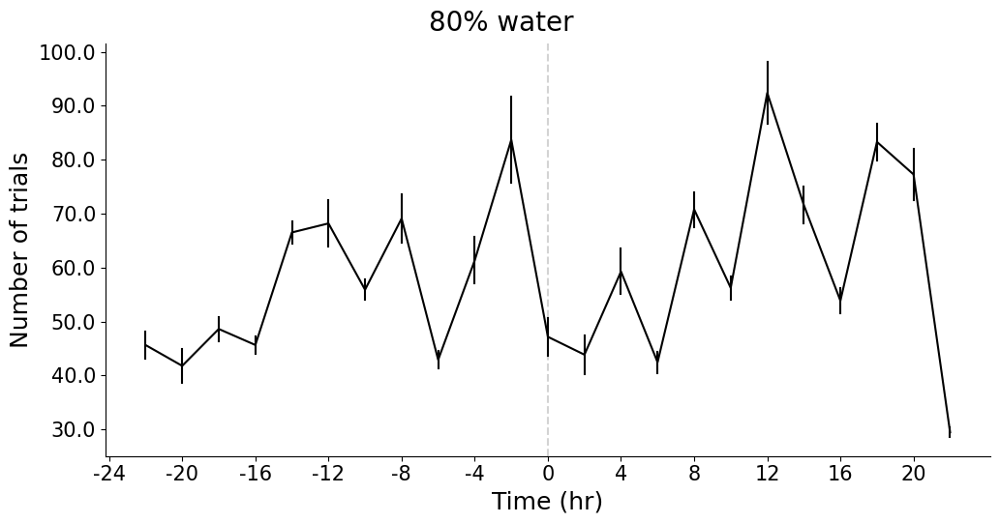

In [46]:
cond = (counts2h["Time (hr)"] < 24) & (counts2h["Time (hr)"] > -24) 
for condition in counts2h["condition"].unique():
    g = sns.relplot(counts2h[cond & (counts2h["condition"] == condition)], x="Time (hr)", y="trial no", color="k", kind="line", 
                    errorbar="se", err_style="bars", aspect=2, legend=False)
    ticks = [i for i in range(-24, 24, 4)]
    g.fig.suptitle(f"{titles[condition]}", x=.48, y=1.04,size=20)
    for ax in g.axes.flat:
        ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
        ax.set_xticks(ticks)
        ax.set_xticklabels(ticks, ha='center', fontdict={"fontsize":15})
        ax.set_yticklabels(ax.get_yticks(), fontdict={"fontsize":15})
        ax.tick_params(labelbottom=True)
        ax.set_ylabel("Number of trials", size=18)
        ax.set_xlabel("Time (hr)", size=18)


#### 4 hours

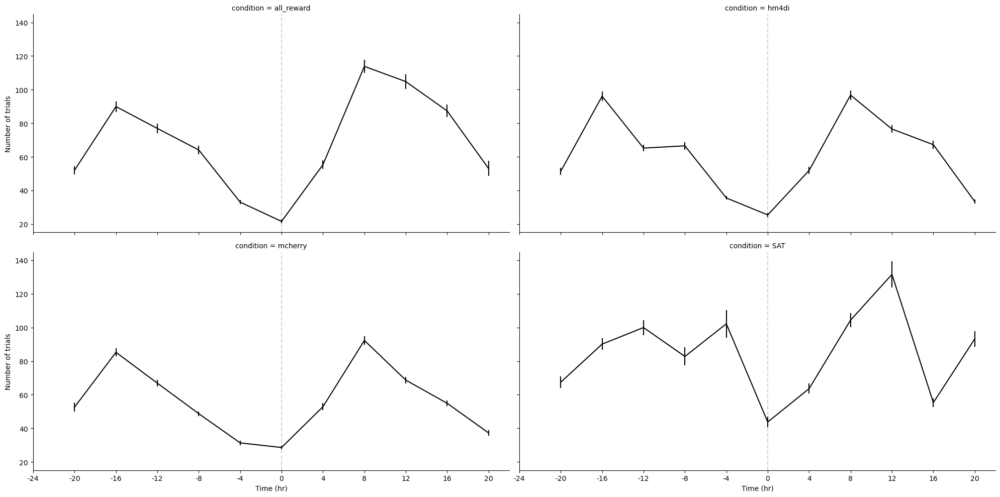

In [47]:
cond = (counts4h["Time (hr)"] < 24) & (counts4h["Time (hr)"] > -24) 
g = sns.relplot(counts4h[cond], x="Time (hr)", y="trial no", color="k", kind="line", col="condition",errorbar="se", err_style="bars", aspect=2, col_wrap=2)

ticks = [i for i in range(-24, 24, 4)]
for ax in g.axes.flat:
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticks, ha='center')
    ax.set_ylabel("Number of trials")

### Air Puff licking curves

#### 1 hour

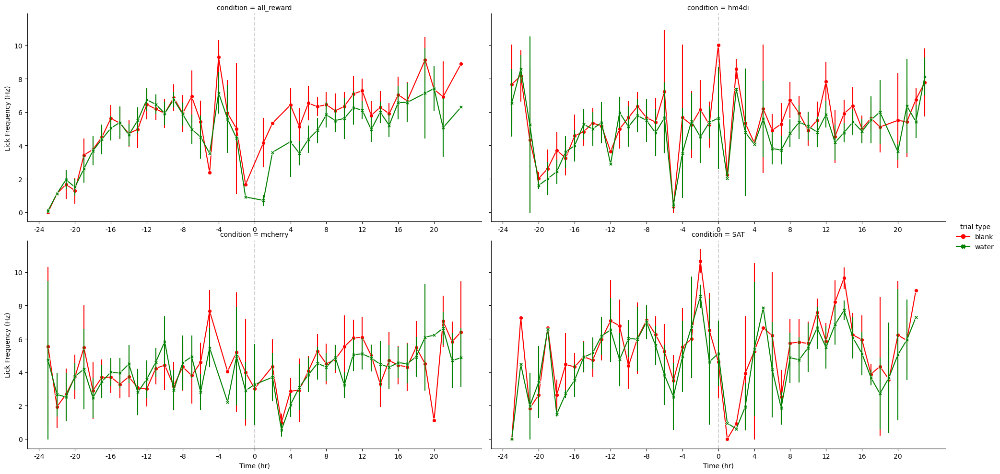

In [48]:
pufflick1h = data1h[data1h["Time (ms)"] == 300]
cond = (pufflick1h["Time (hr)"] < 24) & (pufflick1h["Time (hr)"] > -24) 

g = sns.relplot(pufflick1h[cond], x="Time (hr)", y="lick", hue="trial type", col="condition", palette=["red", "green"], hue_order=["blank", "water"], 
            kind="line", errorbar="se", err_style="bars", style="trial type", dashes=False, markers=True, aspect=2, col_wrap=2)
ticks = [i for i in range(-24, 24, 4)]
for ax in g.axes.flat:
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticks, ha='center')
    ax.tick_params(labelbottom=True)
    ax.set_ylabel("Lick Frequency (Hz)")

#### 2 hours

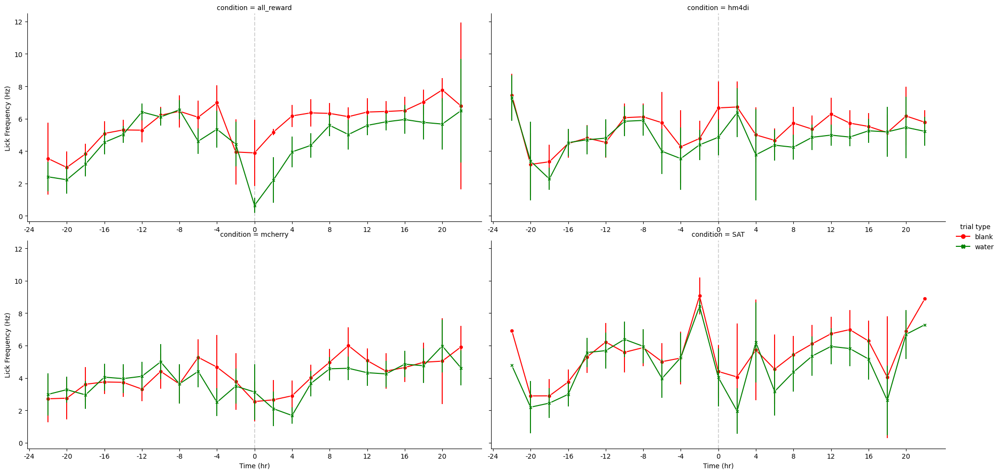

In [49]:
pufflick2h = data2h[data2h["Time (ms)"] == 300]
cond = (pufflick2h["Time (hr)"] < 24) & (pufflick2h["Time (hr)"] > -24) 

g = sns.relplot(pufflick2h[cond], x="Time (hr)", y="lick", hue="trial type", col="condition", palette=["red", "green"], hue_order=["blank", "water"], 
            kind="line", errorbar="se", err_style="bars", style="trial type", dashes=False, markers=True, aspect=2, col_wrap=2)
ticks = [i for i in range(-24, 24, 4)]
for ax in g.axes.flat:
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticks, ha='center')
    ax.tick_params(labelbottom=True)
    ax.set_ylabel("Lick Frequency (Hz)")

#### 4 hours

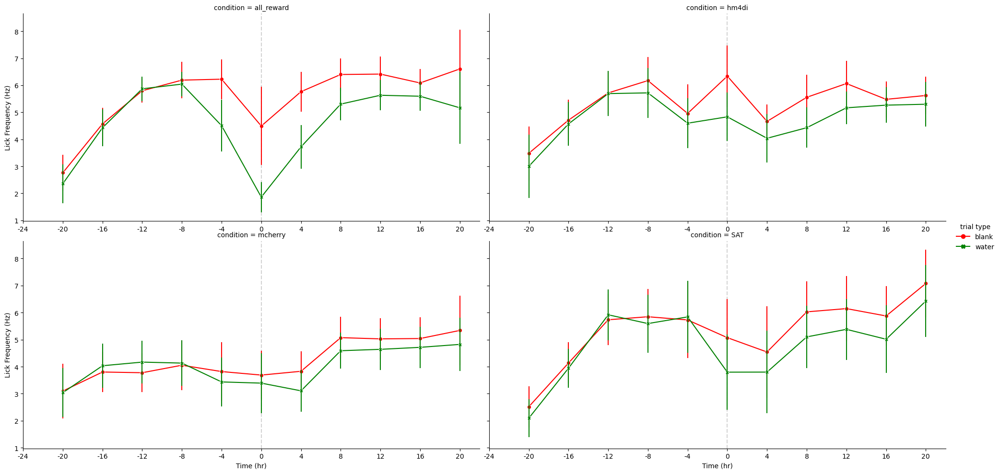

In [50]:
pufflick4h = data4h[data4h["Time (ms)"] == 300]
cond = (pufflick4h["Time (hr)"] < 24) & (pufflick4h["Time (hr)"] > -24) 

g = sns.relplot(pufflick4h[cond], x="Time (hr)", y="lick", hue="trial type", col="condition", palette=["red", "green"], hue_order=["blank", "water"], 
            kind="line", errorbar="se", err_style="bars", style="trial type", dashes=False, markers=True, aspect=2, col_wrap=2)
ticks = [i for i in range(-24, 24, 4)]
for ax in g.axes.flat:
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticks, ha='center')
    ax.tick_params(labelbottom=True)
    ax.set_ylabel("Lick Frequency (Hz)")

### Full licking curves by timebin

#### Full train time, 4 hour timebins

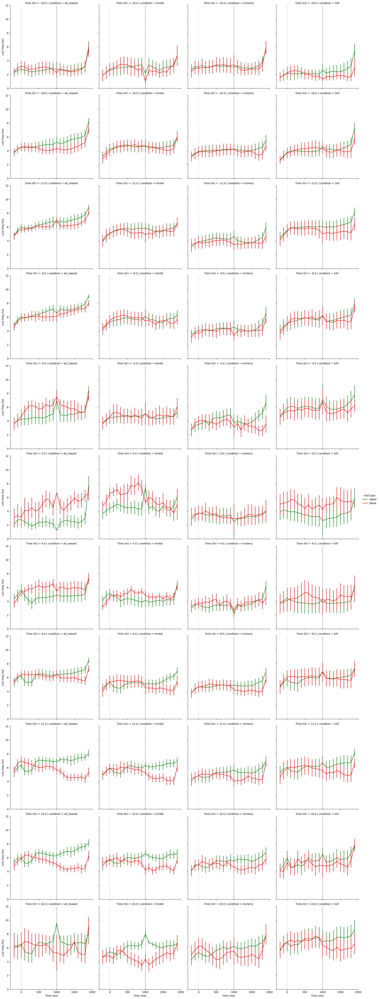

In [51]:
# only plot last day of acclimation and first day of SAT
cond = (data4h["Time (hr)"] < 24) & (data4h["Time (hr)"] > -24)

# plot all timebins average performance trace on the same plot
g = sns.relplot(data=data4h[cond],kind="line",x="Time (ms)", y="lick",col="condition", row="Time (hr)",
                hue="trial type", palette=["green", "red"], hue_order=["water", "blank"], errorbar="se",err_style="bars", legend="full")


# add lines at air puff and water delivery
for ax in g.axes.flat:
    ax.axhline(y=0, xmin=0, xmax=1, ls="-", lw=0.75,color="black", zorder=0)
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.axvline(x=1000, ymin=0, ymax=1, ls="--", color="navy", alpha=0.5, zorder=0)
    ax.set_ylim([0, 12])
    ax.set_ylabel("Lick Freq (hz)")

#### Full train time, 2 hour timebins

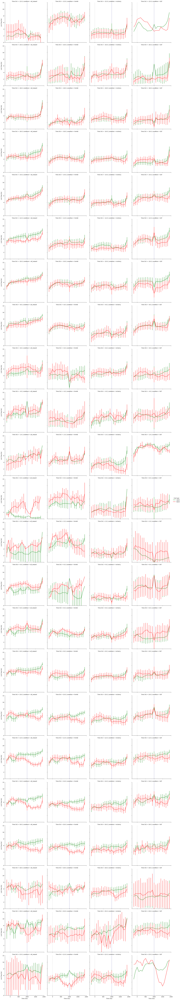

In [52]:
# only plot last day of acclimation and first day of SAT
cond = (data2h["Time (hr)"] < 24) & (data2h["Time (hr)"] > -24)

# plot all timebins average performance trace on the same plot
g = sns.relplot(data=data2h[cond],kind="line",x="Time (ms)", y="lick",col="condition", row="Time (hr)",
                hue="trial type", palette=["green", "red"], hue_order=["water", "blank"], errorbar="se",err_style="bars", legend="full")


# add lines at air puff and water delivery
for ax in g.axes.flat:
    ax.axhline(y=0, xmin=0, xmax=1, ls="-", lw=0.75,color="black", zorder=0)
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.axvline(x=1000, ymin=0, ymax=1, ls="--", color="navy", alpha=0.5, zorder=0)
    ax.set_ylim([0, 12])
    ax.set_ylabel("Lick Freq (hz)")

#### 10-14 hours, 1 hour timebins

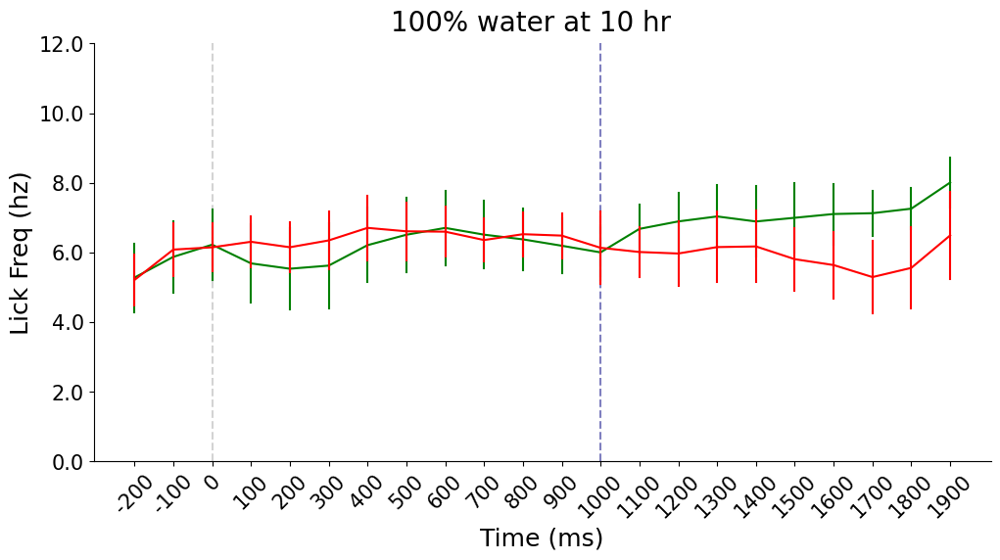

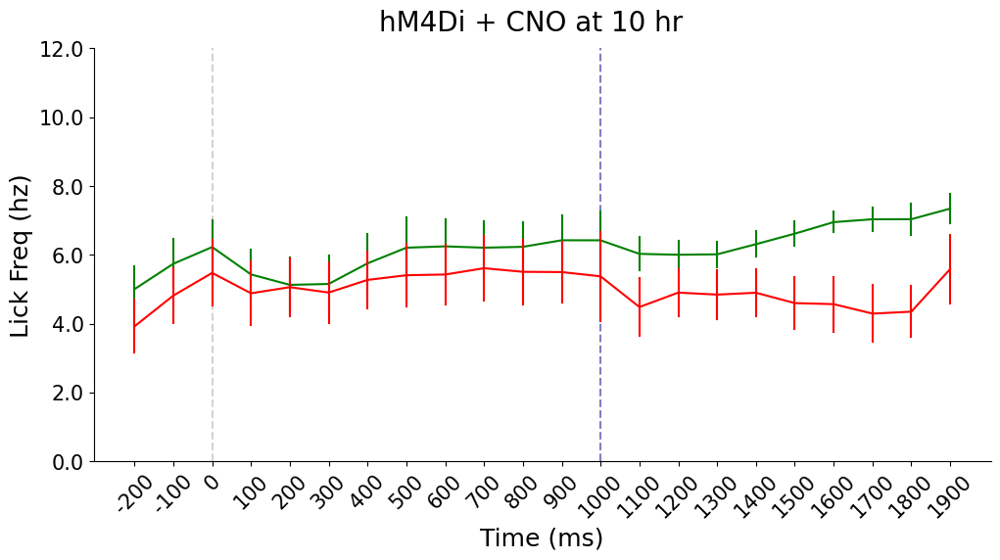

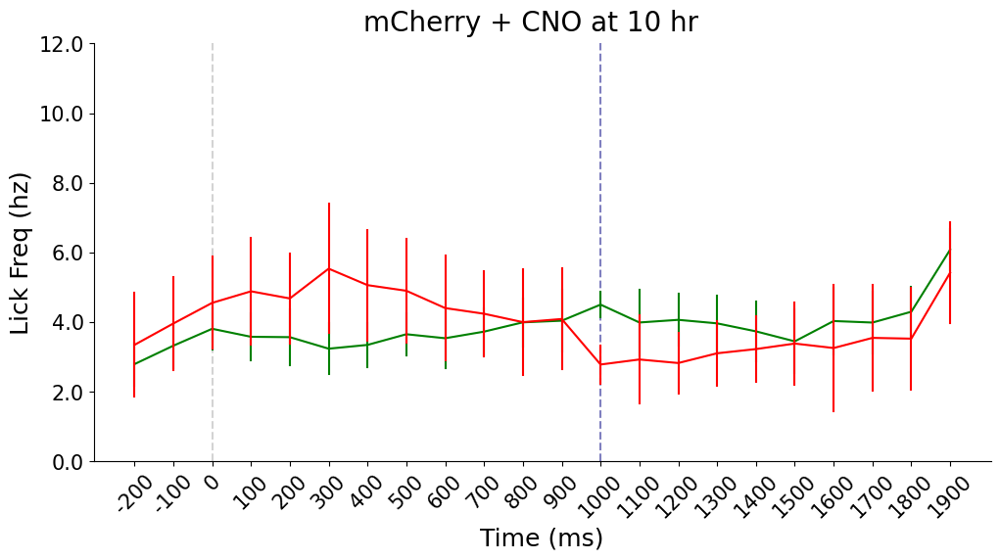

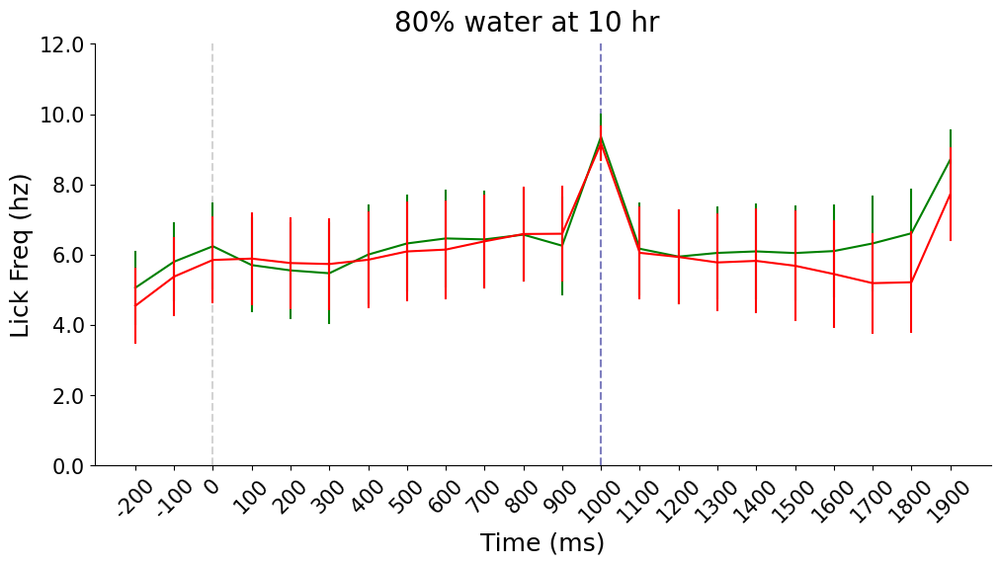

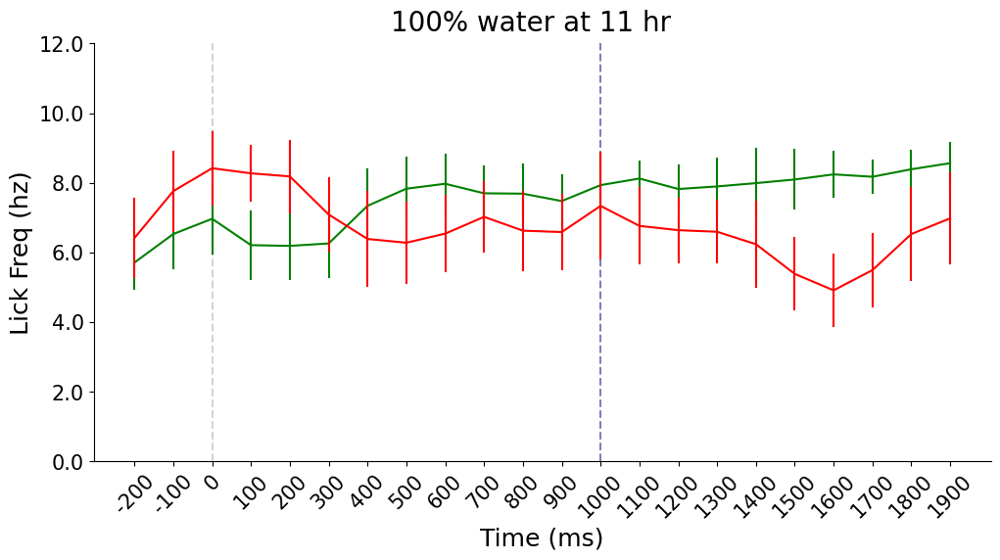

...

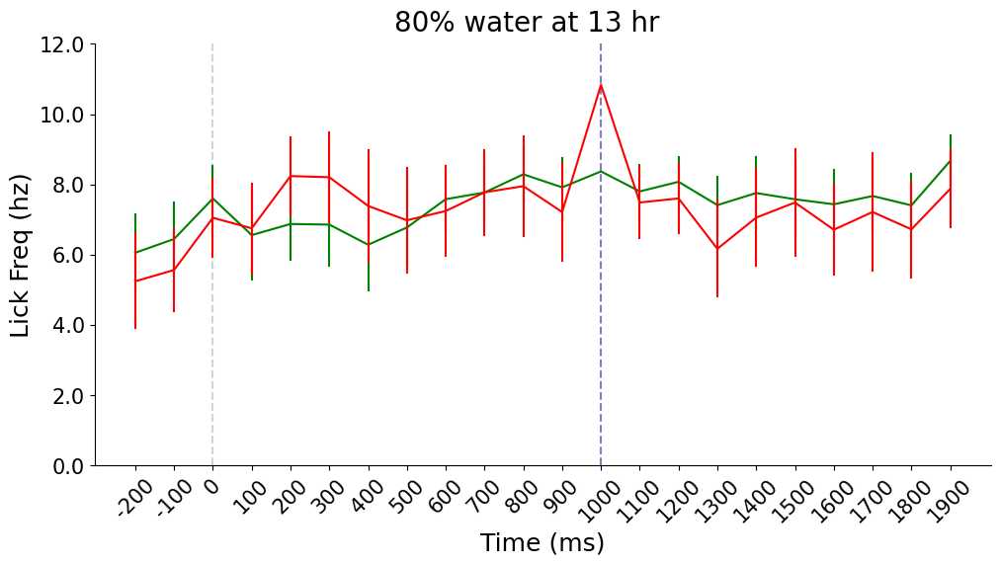

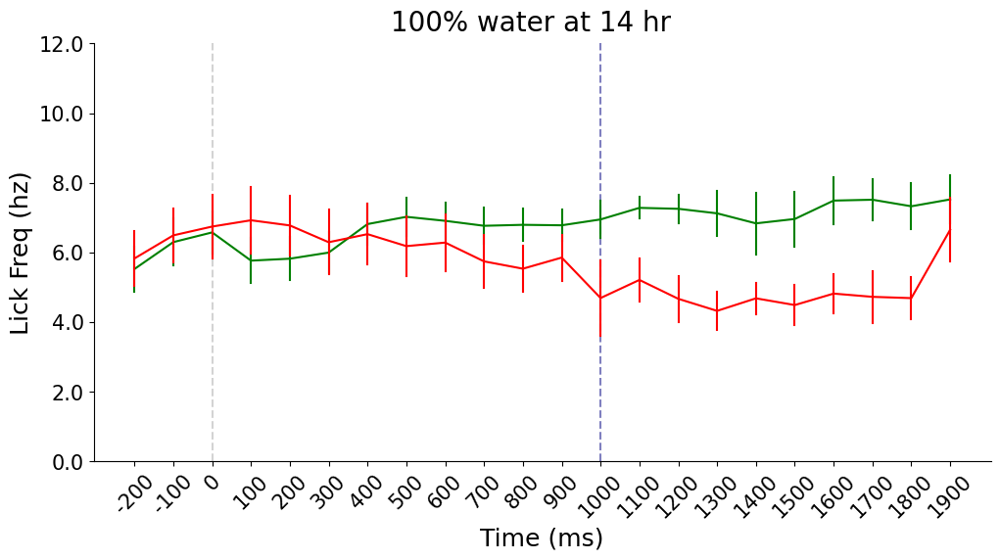

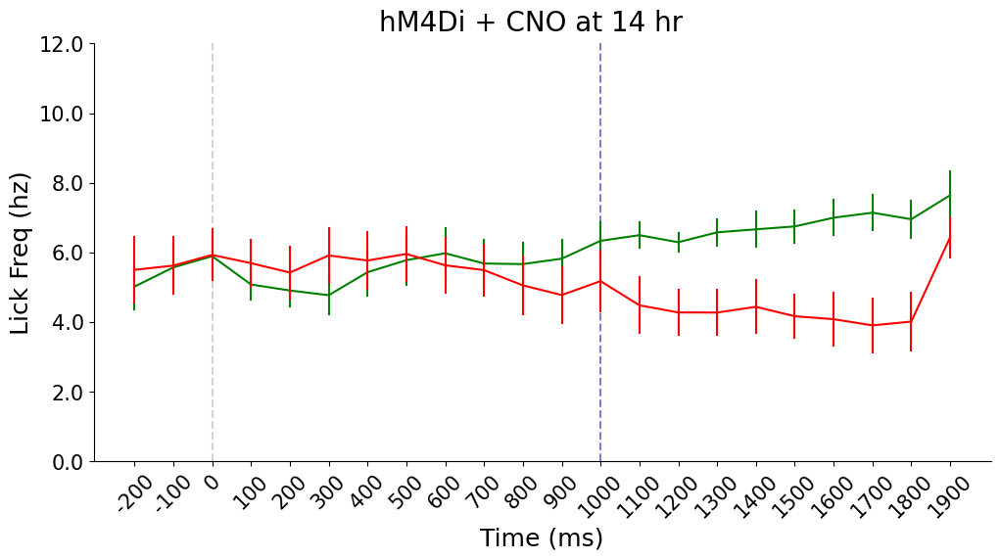

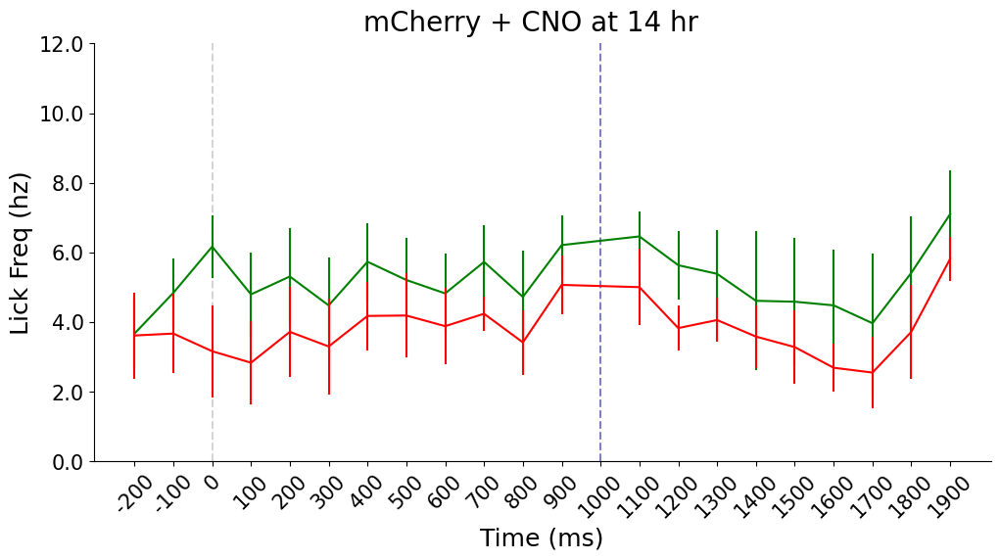

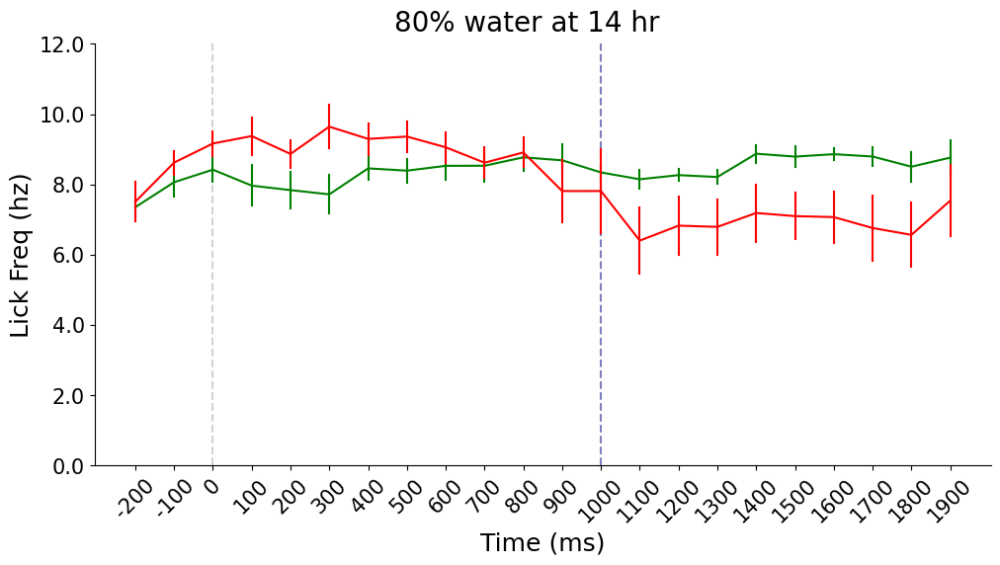

In [53]:
titles = {"all_reward":"100% water", "SAT": "80% water", "hm4di":"hM4Di + CNO", "mcherry":"mCherry + CNO"}
# only plot last day of acclimation and first day of SAT
cond = (data1h["Time (hr)"] <= 14) & (data1h["Time (hr)"] >= 10)
ticks = range(-200, 2000, 100)
for h in range(10, 15, 1):
    for condition in data1h["condition"].unique():
        cond = (data1h["Time (hr)"] == h) & (data1h["condition"] == condition)
# plot all timebins average performance trace on the same plot
        g = sns.relplot(data=data1h[cond],kind="line",x="Time (ms)", y="lick", aspect=2,
                        hue="trial type", palette=["green", "red"], hue_order=["water", "blank"], errorbar="se",err_style="bars",legend=False)
        # add lines at air puff and water delivery
        g.fig.suptitle(f"{titles[condition]} at {h} hr", size=20, x=.5, y=1.04)
        for ax in g.axes.flat:
            ax.axhline(y=0, xmin=0, xmax=1, ls="-", lw=0.75,color="black", zorder=0)
            ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
            ax.axvline(x=1000, ymin=0, ymax=1, ls="--", color="navy", alpha=0.5, zorder=0)
            ax.set_ylim([0, 12])
            ax.set_ylabel("Lick Freq (hz)", size=18)
            ax.set_xlabel("Time (ms)", size=18)
            ax.set_yticklabels(ax.get_yticks(), fontdict={"fontsize":15})
            ax.set_xticks(ticks)
            ax.set_xticklabels(ticks, fontdict={"fontsize":15}, ha="center", rotation=45)

#### -2-6 hours, 2h timebins

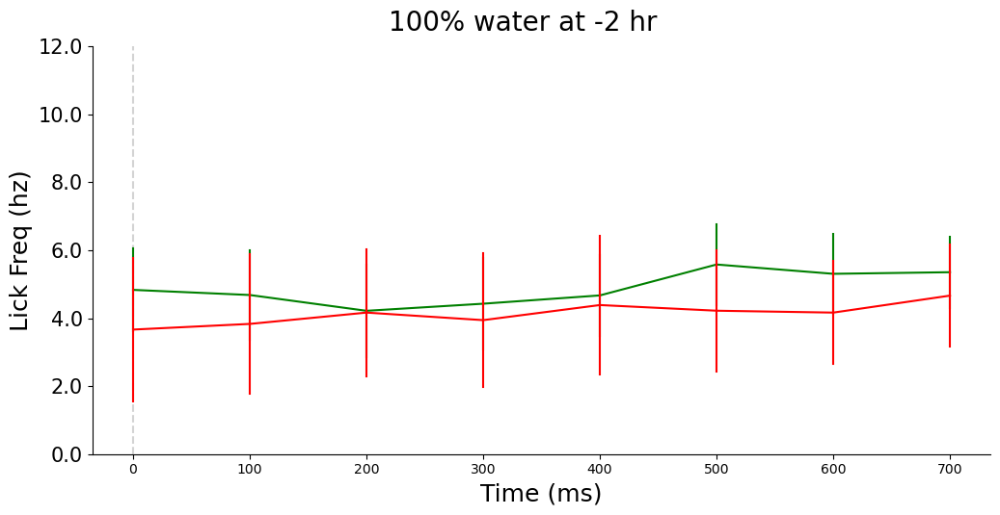

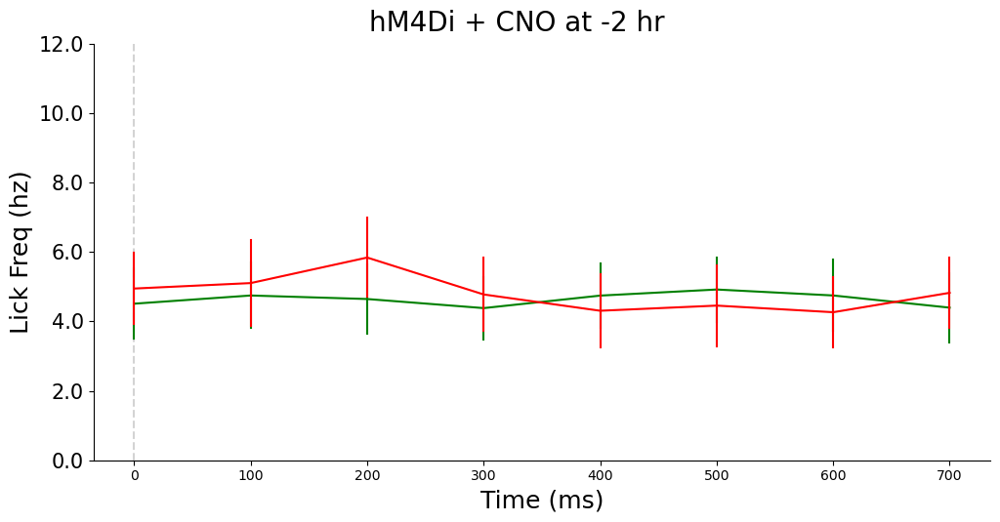

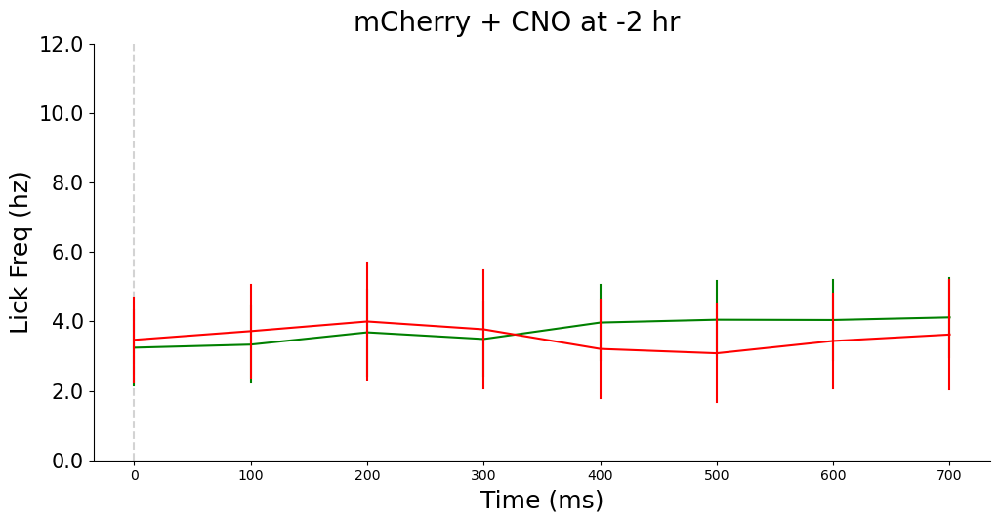

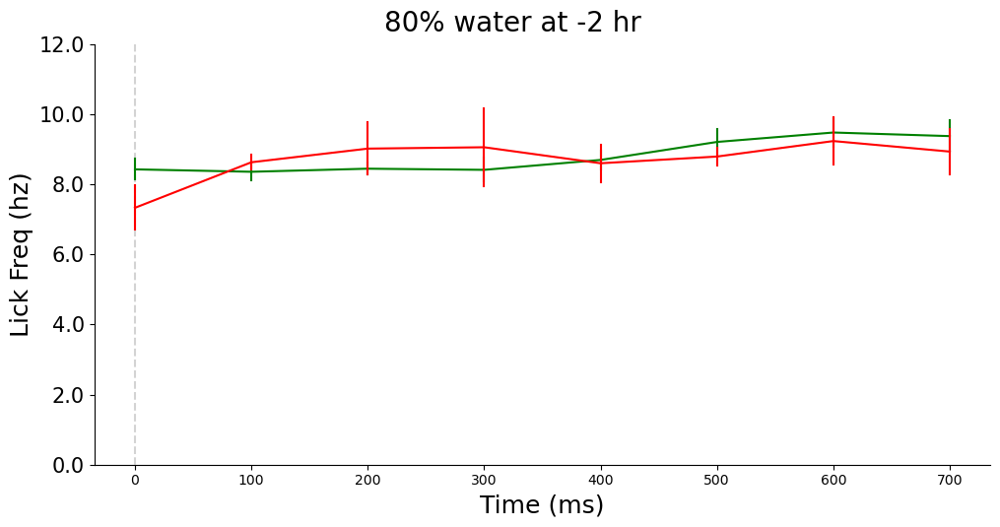

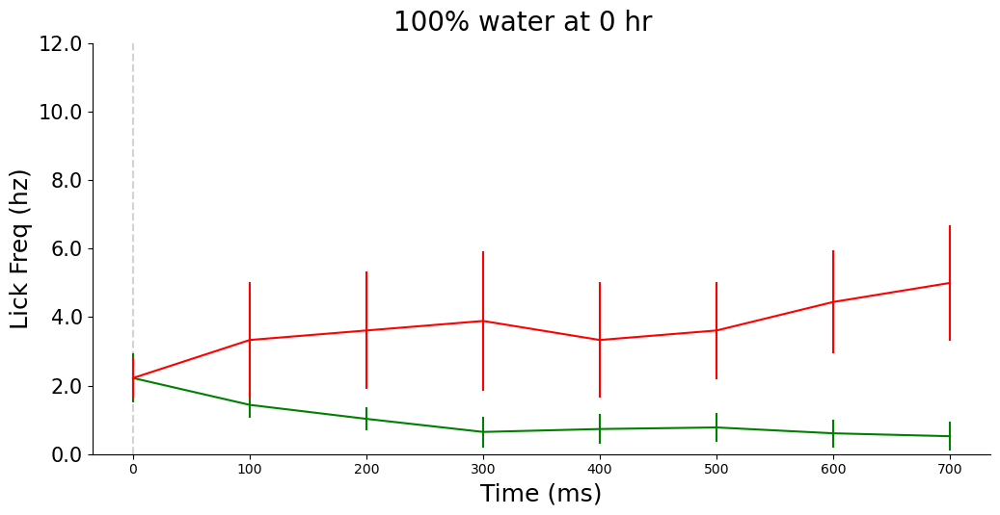

...

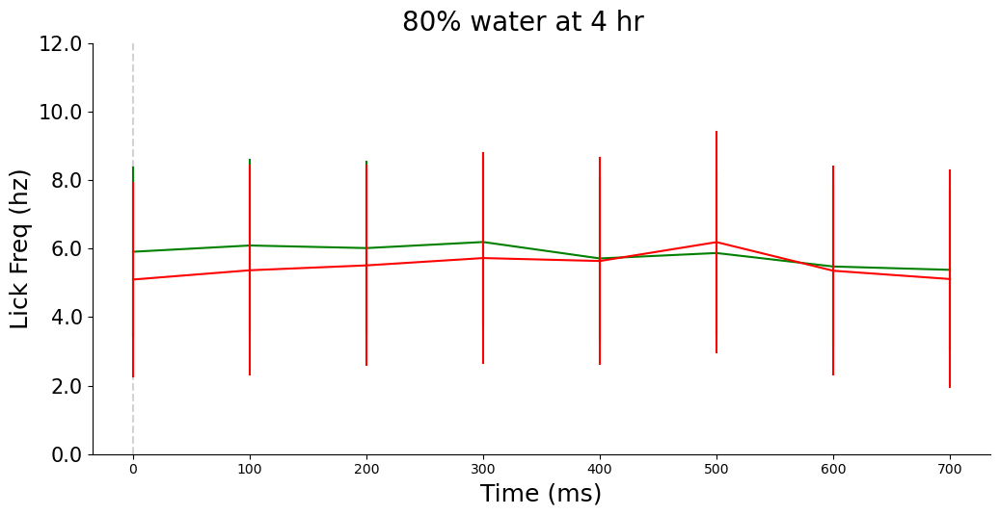

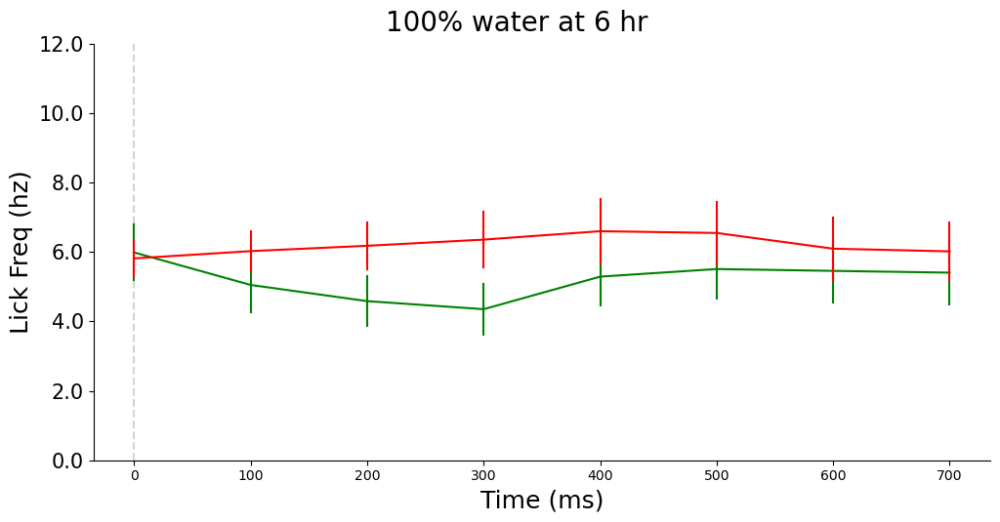

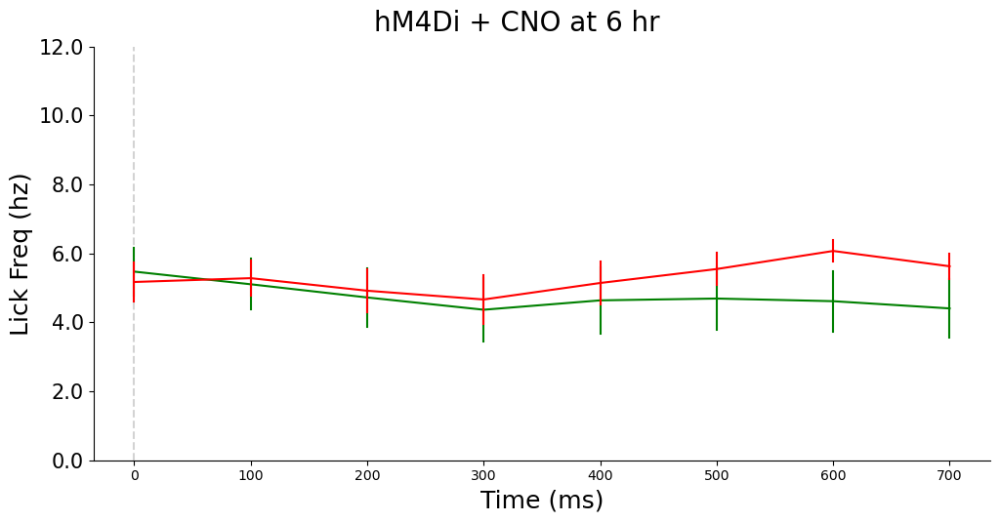

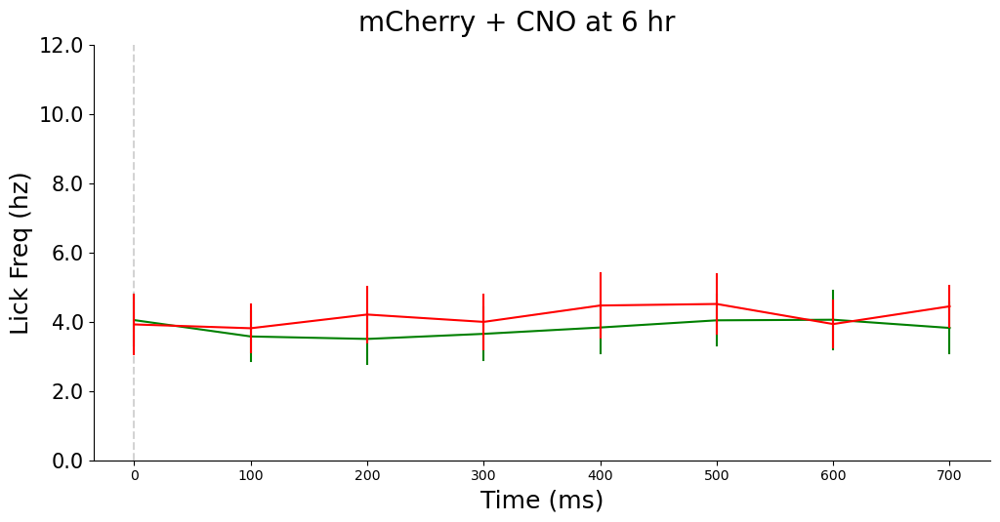

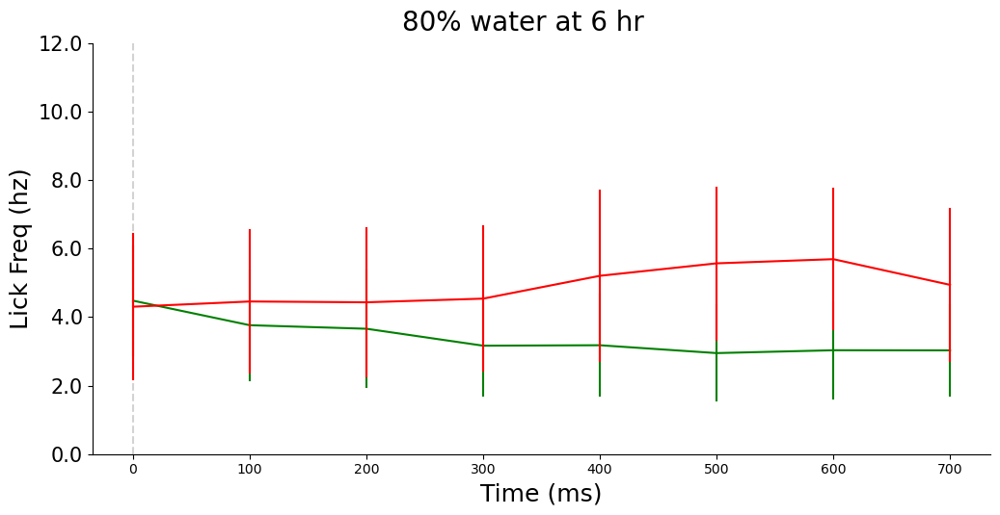

In [100]:
titles = {"all_reward":"100% water", "SAT": "80% water", "hm4di":"hM4Di + CNO", "mcherry":"mCherry + CNO"}
# only plot last day of acclimation and first day of SAT
cond = (data2h["Time (ms)"] <= 700) & (data2h["Time (ms)"] >= 0)
ticks = range(-200, 2000, 100)
for h in range(-2, 8, 2):
    for condition in data2h["condition"].unique():
        cond2 = (data2h["Time (hr)"] == h) & (data2h["condition"] == condition)
# plot all timebins average performance trace on the same plot
        g = sns.relplot(data=data2h[cond & cond2],kind="line",x="Time (ms)", y="lick", aspect=2,
                        hue="trial type", palette=["green", "red"], hue_order=["water", "blank"], errorbar="se",err_style="bars",legend=False)
        # add lines at air puff and water delivery
        g.fig.suptitle(f"{titles[condition]} at {h} hr", size=20, x=.5, y=1.04)
        for ax in g.axes.flat:
            ax.axhline(y=0, xmin=0, xmax=1, ls="-", lw=0.75,color="black", zorder=0)
            ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
            #ax.axvline(x=1000, ymin=0, ymax=1, ls="--", color="navy", alpha=0.5, zorder=0)
            ax.set_ylim([0, 12])
            ax.set_ylabel("Lick Freq (hz)", size=18)
            ax.set_xlabel("Time (ms)", size=18)
            ax.set_yticklabels(ax.get_yticks(), fontdict={"fontsize":15})
            #ax.set_xticks(ticks)
            #ax.set_xticklabels(ticks, fontdict={"fontsize":15}, ha="center", rotation=45)

### Performance

#### 4 hour timebins

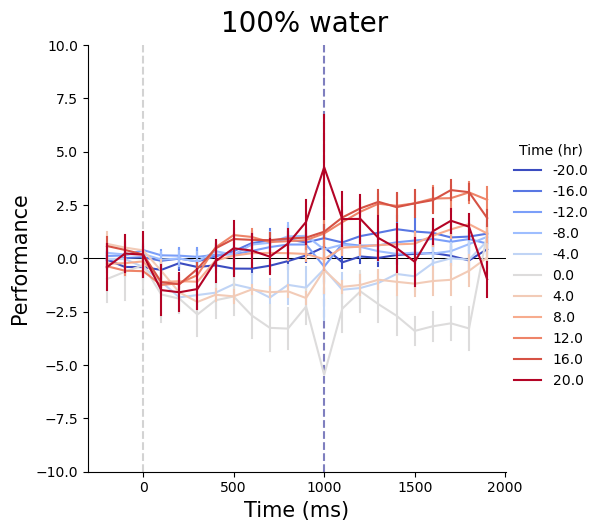

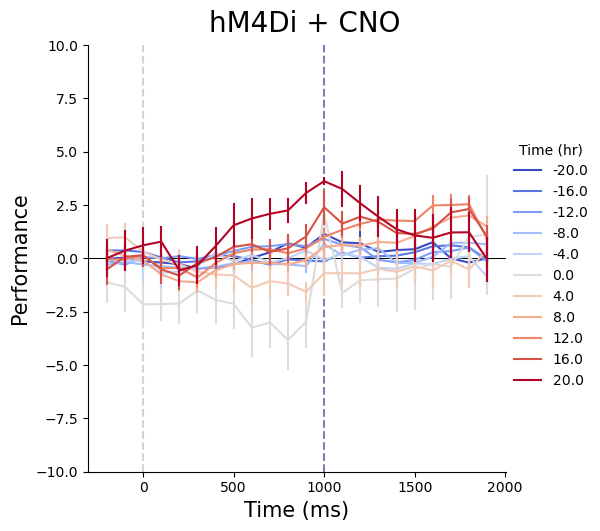

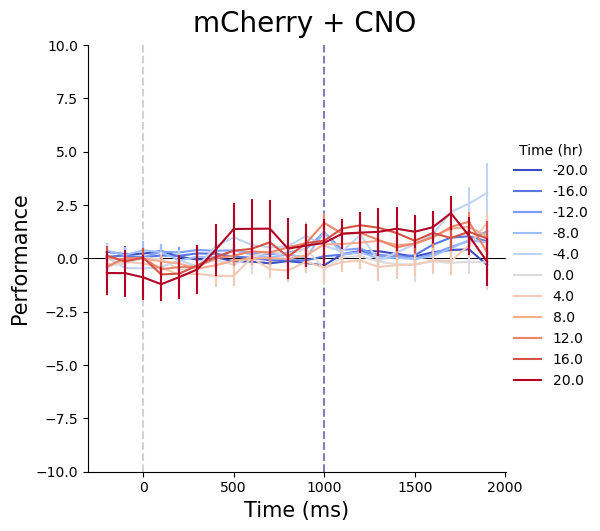

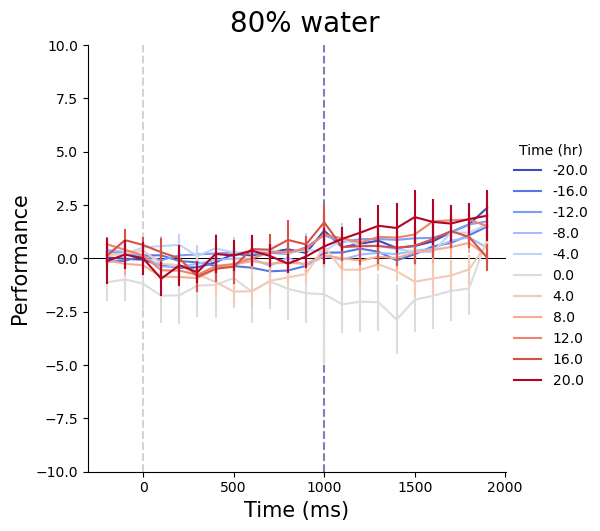

In [80]:
# only plot last day of acclimation and first day of SAT
cond = (perf4h["Time (hr)"] < 24) & (perf4h["Time (hr)"] > -24)
titles = {"all_reward":"100% water", "SAT": "80% water", "hm4di":"hM4Di + CNO", "mcherry":"mCherry + CNO"}
# plot all timebins average performance trace on the same plot
for condition in perf4h["condition"].unique():
    g = sns.relplot(data=perf4h[cond & (perf4h["condition"] == condition)],kind="line",x="Time (ms)", y="lick",
                    hue="Time (hr)", palette="coolwarm", errorbar="se",err_style="bars", legend="full")
    # add lines at air puff and water delivery
    for ax in g.axes.flat:
        ax.axhline(y=0, xmin=0, xmax=1, ls="-", lw=0.75,color="black", zorder=0)
        ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
        ax.axvline(x=1000, ymin=0, ymax=1, ls="--", color="navy", alpha=0.5, zorder=0)
        ax.set_ylim([-10, 10])
        ax.set_ylabel("Performance", size=15)
        ax.set_xlabel("Time (ms)", size=15)
        g.fig.suptitle(f"{titles[condition]}", x=0.5, y=1.04, size=20)

#### 2 hour timebins

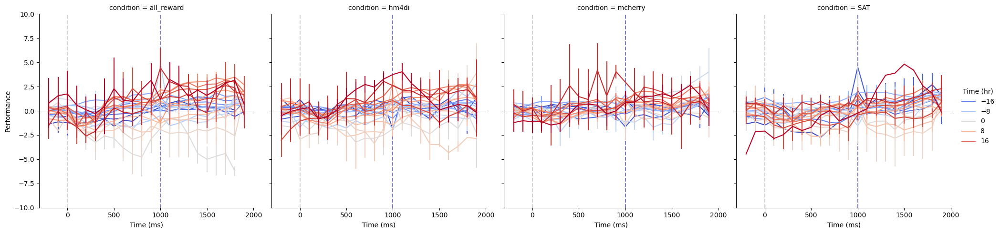

In [56]:
# only plot last day of acclimation and first day of SAT
cond = (perf2h["Time (hr)"] < 24) & (perf2h["Time (hr)"] > -24)

# plot all timebins average performance trace on the same plot
g = sns.relplot(data=perf2h[cond],kind="line",x="Time (ms)", y="lick",col="condition", 
                hue="Time (hr)", palette="coolwarm", errorbar="se",err_style="bars", legend="brief")

# add lines at air puff and water delivery
for ax in g.axes.flat:
    ax.axhline(y=0, xmin=0, xmax=1, ls="-", lw=0.75,color="black", zorder=0)
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.axvline(x=1000, ymin=0, ymax=1, ls="--", color="navy", alpha=0.5, zorder=0)
    ax.set_ylim([-10, 10])
    ax.set_ylabel("Performance")

#### 1 hour timebins

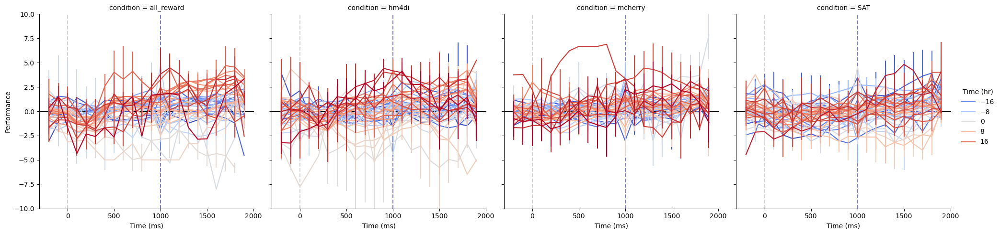

In [57]:
# only plot last day of acclimation and first day of SAT
cond = (perf1h["Time (hr)"] < 24) & (perf1h["Time (hr)"] > -24)

# plot all timebins average performance trace on the same plot
g = sns.relplot(data=perf1h[cond],kind="line",x="Time (ms)", y="lick",col="condition", 
                hue="Time (hr)", palette="coolwarm", errorbar="se",err_style="bars", legend="brief")

# add lines at air puff and water delivery
for ax in g.axes.flat:
    ax.axhline(y=0, xmin=0, xmax=1, ls="-", lw=0.75,color="black", zorder=0)
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.axvline(x=1000, ymin=0, ymax=1, ls="--", color="navy", alpha=0.5, zorder=0)
    ax.set_ylim([-10, 10])
    ax.set_ylabel("Performance")

#### average performance trace by timebin, 4h timebins, with each animals' performance in the background

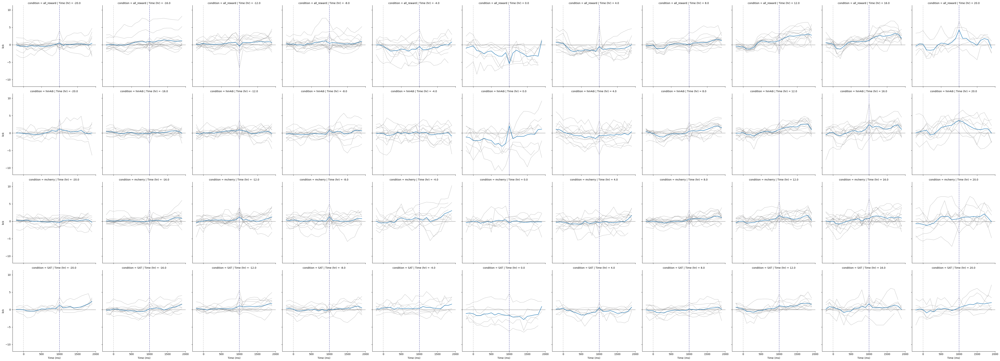

In [58]:
cond = (perf4h["Time (hr)"] < 24) & (perf4h["Time (hr)"] > -24) 
g = sns.relplot(data=perf4h[cond],kind="line",x="Time (ms)", 
                y="lick",col="Time (hr)", row="condition", errorbar=None, zorder=5)

for (train_type, time), ax in g.axes_dict.items():
    an_cond = perf4h["condition"] == train_type
    time_cond = perf4h["Time (hr)"] == time
    sns.lineplot(
            data=perf4h[cond & an_cond & time_cond], x="Time (ms)", y="lick", hue="animal", 
            palette=["grey"], alpha=0.5,linewidth=1, ax=ax, legend=False)
    ax.axhline(y=0, xmin=0, xmax=1, ls="--", lw=0.75,color="black", zorder=0)
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.axvline(x=1000, ymin=0, ymax=1, ls="--", color="navy", alpha=0.5, zorder=0)

#### 11-16 hours, 1 hour timebins

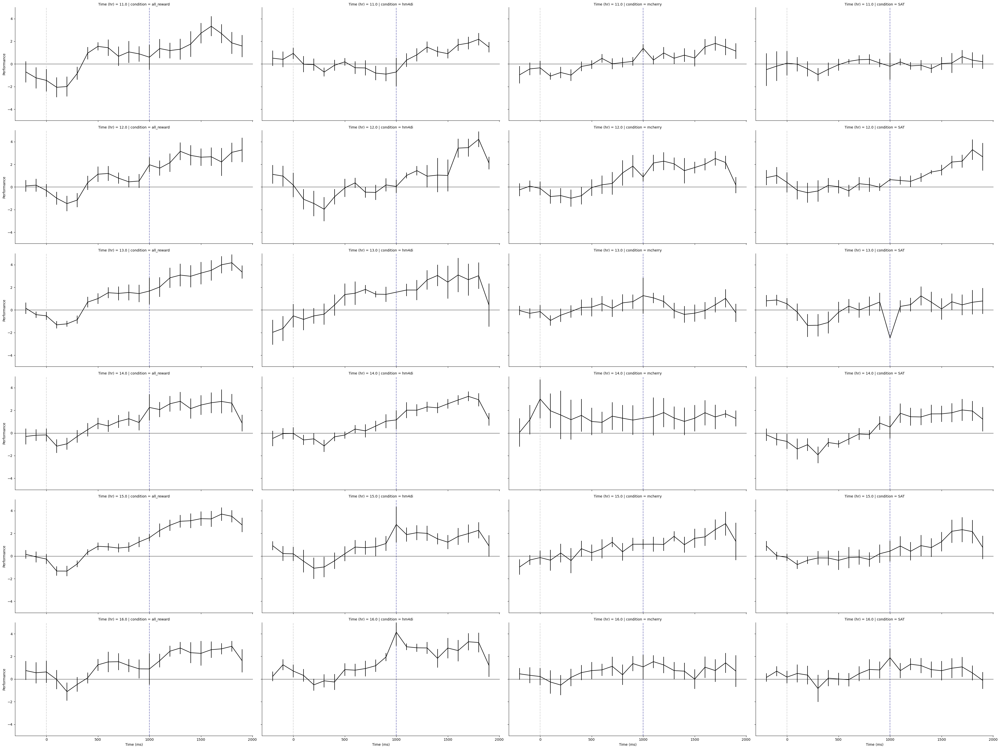

In [59]:
# only plot last day of acclimation and first day of SAT
cond = (perf1h["Time (hr)"] <= 16) & (perf1h["Time (hr)"] >= 11)

# plot all timebins average performance trace on the same plot
g = sns.relplot(data=perf1h[cond],kind="line",x="Time (ms)", y="lick",col="condition", color="k",row="Time (hr)", aspect=2,
                errorbar="se",err_style="bars", legend="full")


# add lines at air puff and water delivery
for ax in g.axes.flat:
    ax.axhline(y=0, xmin=0, xmax=1, ls="-", lw=0.75,color="black", zorder=0)
    ax.axvline(x=0, ymin=0, ymax=1, ls="--", color="lightgrey", zorder=0)
    ax.axvline(x=1000, ymin=0, ymax=1, ls="--", color="navy", alpha=0.5, zorder=0)
    ax.set_ylim([-5, 5])
    ax.set_ylabel("Performance")

### Learning Comparison

#### Licking Frequency Water vs Blank

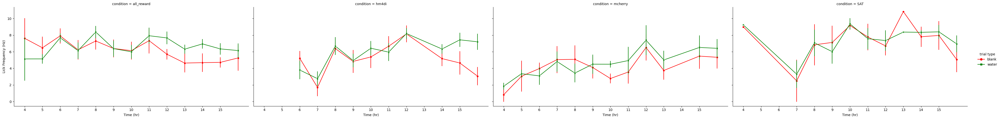

In [60]:
antlick1h = data1h[data1h["Time (ms)"] == 1000]
cond = (antlick1h["Time (hr)"] <=16) & (antlick1h["Time (hr)"] >= 4) 

g = sns.relplot(antlick1h[cond], x="Time (hr)", y="lick", hue="trial type", col="condition", palette=["red", "green"], hue_order=["blank", "water"], 
            kind="line", errorbar="se", err_style="bars", style="trial type", dashes=False, markers=True, aspect=2)
ticks = [i for i in range(4, 16, 1)]
for ax in g.axes.flat:
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticks, ha='center')
    ax.tick_params(labelbottom=True)
    ax.set_ylabel("Lick Frequency (Hz)")

#### Performance

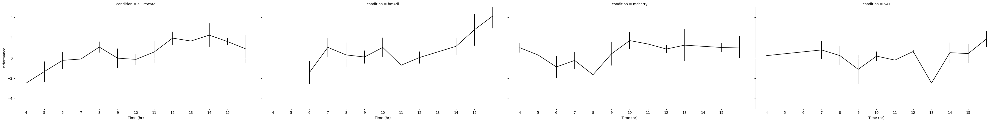

In [61]:
antperf1h  = perf1h[perf1h["Time (ms)"] == 1000]
cond = (antperf1h["Time (hr)"] <=16) & (antperf1h["Time (hr)"] >= 4) 

g = sns.relplot(antperf1h[cond], x="Time (hr)", y="lick", col="condition", color='k',
            kind="line", errorbar="se", err_style="bars", aspect=2)
ticks = [i for i in range(4, 16, 1)]
for ax in g.axes.flat:
    ax.set_xticks(ticks)
    ax.set_xticklabels(ticks, ha='center')
    ax.tick_params(labelbottom=True)
    ax.axhline(y=0, xmin=0, xmax=1, ls="-", lw=0.75,color="black", zorder=0)
    ax.set_ylim([-5, 5])
    ax.set_ylabel("Performance")

#### Time from start of trial to positive performance

In [62]:
# average performance by timebin across all animals
index = ["condition", "Time (hr)", "Time (ms)"]
keep = ["age", "sex", "strain"]

gp = perf1h.groupby(index)
perfavg1h = gp["lick"].mean()
kp = gp[keep].first()
perfavg1h = pd.concat([perfavg1h, kp], axis=1).reset_index()

gp = perf2h.groupby(index)
perfavg2h = gp["lick"].mean()
kp = gp[keep].first()
perfavg2h = pd.concat([perfavg2h, kp], axis=1).reset_index()

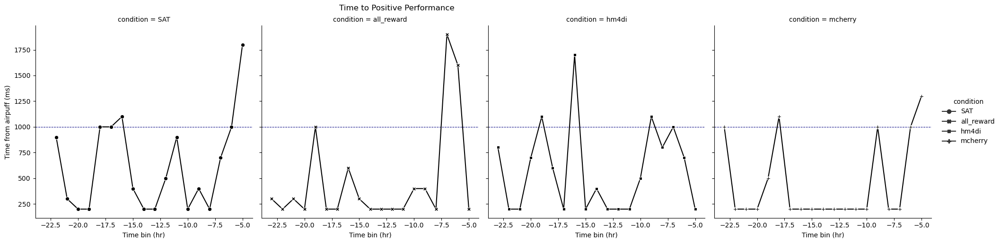

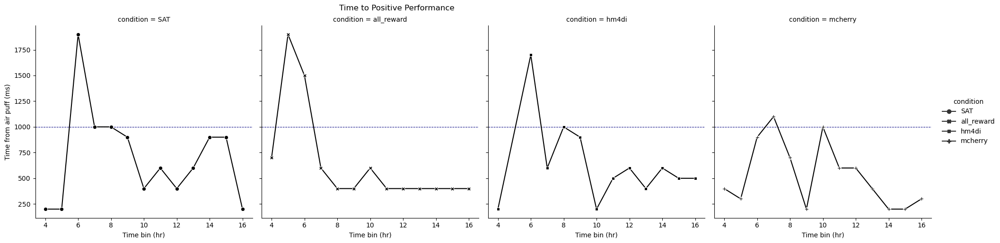

In [63]:
# average time until performance becomes positive from start of air for each timebin

cond = (perfavg1h["lick"] > 0) & (perfavg1h["Time (ms)"] > 100)
pt = perfavg1h[cond].groupby(["condition", "Time (hr)"]).first().reset_index()

cond = (pt["Time (hr)"] < -4) & (pt["Time (hr)"] > -24)
g = sns.relplot(data=pt[cond], kind="line", x="Time (hr)", y="Time (ms)", col="condition", color='k',
                style="condition", dashes=False, markers=True)
g.fig.suptitle("Time to Positive Performance", x=0.4, y=1.02)
g.set_xlabels("Time bin (hr)")
g.set_ylabels("Time from airpuff (ms)") 
for ax in g.axes.flat: 
    ax.axhline(y=1000, xmin=0, xmax=1, ls="--", lw=0.75,color="navy", zorder=0)

cond = (pt["Time (hr)"] <= 16) & (pt["Time (hr)"] >= 4)
g = sns.relplot(data=pt[cond], kind="line", x="Time (hr)", y="Time (ms)", col="condition", color='k',
                style="condition", dashes=False, markers=True)
g.fig.suptitle("Time to Positive Performance", x=0.4, y=1.02)
g.set_xlabels("Time bin (hr)")
g.set_ylabels("Time from air puff (ms)")  
for ax in g.axes.flat: 
    ax.axhline(y=1000, xmin=0, xmax=1, ls="--", lw=0.75,color="navy", zorder=0)  

#### barplot focus on 6-12h

Time is sampled at 10 Hz, so can only be a multiple of 100ms

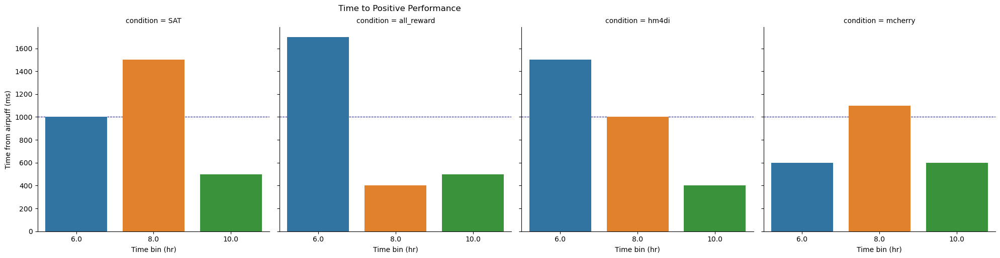

In [64]:
# average time until performance becomes positive from start of air for each timebin
cond = (perfavg2h["lick"] > 0) & (perfavg2h["Time (ms)"] > 100)
pt = perfavg2h[cond].groupby(["condition", "Time (hr)"]).first().reset_index()

cond = (pt["Time (hr)"] <= 10) & (pt["Time (hr)"] >= 6)
g = sns.catplot(data=pt[cond], kind="bar", x="Time (hr)", y="Time (ms)", col="condition")
g.fig.suptitle("Time to Positive Performance", x=0.4, y=1.02)
g.set_xlabels("Time bin (hr)")
g.set_ylabels("Time from airpuff (ms)") 
for ax in g.axes.flat: 
    ax.axhline(y=1000, xmin=0, xmax=1, ls="--", lw=0.75,color="navy", zorder=0)

#### Response to air puff: magnitude of minimum performance

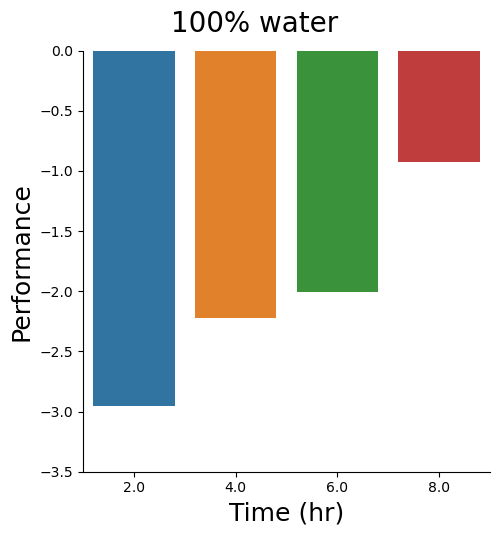

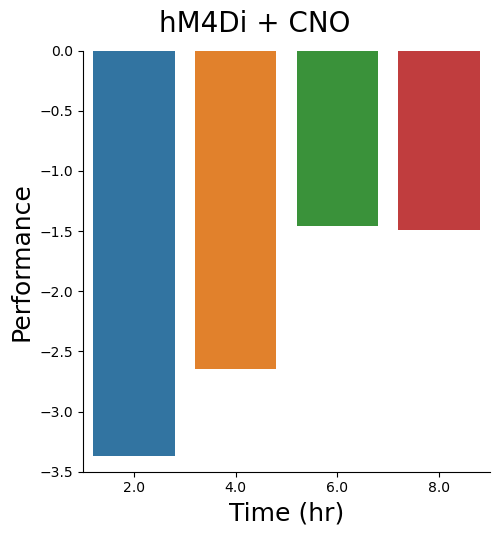

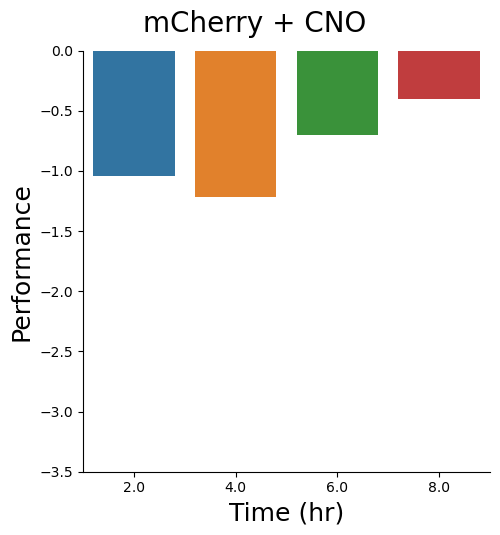

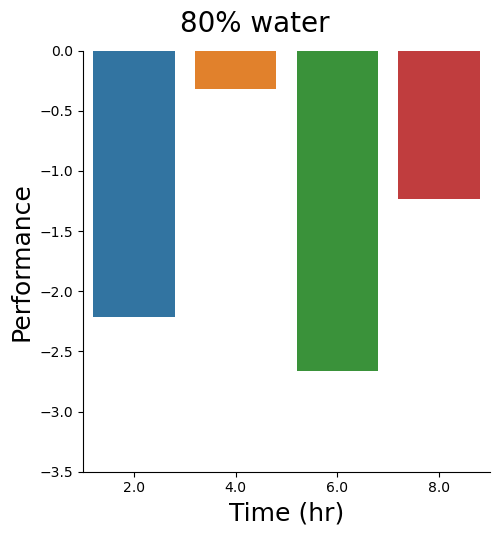

In [75]:
cond = (perfavg2h["Time (hr)"] <= 8) & (perfavg2h["Time (hr)"] > 0) & (perfavg2h["Time (ms)"] > 0) & (perfavg2h["Time (ms)"] < 1000)
titles = {"all_reward":"100% water", "SAT": "80% water", "hm4di":"hM4Di + CNO", "mcherry":"mCherry + CNO"}
pt_puff = perfavg2h[cond].sort_values("lick").groupby(["condition", "Time (hr)"]).first().reset_index()
for condition in data1h["condition"].unique():
    g = sns.catplot(data=pt_puff[pt_puff["condition"] == condition], kind="bar", x="Time (hr)", y="lick")
    g.fig.suptitle(f"{titles[condition]}", x=0.5, y=1.04, size=20)
    g.set_xlabels("Time (hr)", size=18)
    g.set_ylabels("Performance", size=18)  
    g.ax.set_ylim([-3.5, 0])